In [1]:
import pandas as pd

walkability = pd.read_csv('EPAdata.csv')

raceData = pd.read_csv('CensusData.csv')

##remove "150000US" from census's geoID data
for i in range(raceData.shape[0]):
    raceData.iat[i,0] = str(raceData.iat[i,0])[9:]

##concatenate state, county, tract, and block IDs to match census format
combinedID1 = []
combinedID2 = []
for j in range(walkability.shape[0]):
    stateID = str(walkability.iat[j,3])
    if len(stateID) < 2:
        stateID = "0" + stateID
    countyID = str(walkability.iat[j,4])
    if len(countyID) < 3:
        countyID = ("0" * (3 - len(tractID))) + countyID
    blockID = str(walkability.iat[j,6])
    ##because the EPA dataset does not include a decimal (making entries like "201" ambiguous as to whether it means "201" or "2.01"), 
    #we need to create two new columns with both possible tract IDs
    tractID = str(walkability.iat[j,5])
    if len(tractID) == 6:
        combinedID2.append("999999999999")
        combinedID1.append(stateID + countyID + tractID + blockID)
    elif len(tractID) == 5:
        #option 1: has a decimal (e.g. "12345" = "1234.5")
        tractID += "0"
        combinedID1.append(stateID + countyID + tractID + blockID)
        #option 2: does not have a decimal (e.g. "12345" = "12345")
        tractID = "0" + str(walkability.iat[j,5])
        combinedID2.append(stateID + countyID + tractID + blockID)
    elif len(tractID) < 5:
        #option 1: has a decimal (e.g. "201" = "2.01")
        tractID = ("0" * (6 - len(tractID))) + tractID
        combinedID1.append(stateID + countyID + tractID + blockID)
        #option 2: does not have a decimal (e.g. "201" = "201")
        tractID = str(walkability.iat[j,5]) + "00"
        tractID = ("0" * (6 - len(tractID))) + tractID
        combinedID2.append(stateID + countyID + tractID + blockID)
    
walkability.OBJECTID = combinedID1
walkability2 = pd.read_csv('EPAdata.csv')
walkability2.OBJECTID = combinedID2

##sort by ascending geoID
walkability = walkability.sort_values(by=['OBJECTID'])
walkability2 = walkability2.sort_values(by=['OBJECTID'])
walkability.rename(columns = {'OBJECTID':"Geography"}, inplace=True)
walkability2.rename(columns = {'OBJECTID':"Geography"}, inplace=True)
raceData = raceData.sort_values(by=['Geography'])

##combine dataframes
combined1 = pd.merge(walkability, raceData, on="Geography")
combined2 = pd.merge(walkability2, raceData, on="Geography")
combinedAll = pd.concat([combined1, combined2])
combinedAll.drop_duplicates(subset=['Geography'])

##create new columns racial demographics converted to percentages
combinedAll['PercentWhiteAlone'] = (combinedAll['Estimate!!Total:!!White alone'] / combinedAll['Estimate!!Total:']) * 100
combinedAll['PercentBlackAfricanAmericanAlone'] = (combinedAll['Estimate!!Total:!!Black or African American alone']
                                                   / combinedAll['Estimate!!Total:']) * 100
combinedAll['PercentAsianAlone'] = (combinedAll['Estimate!!Total:!!Asian alone'] / combinedAll['Estimate!!Total:']) * 100
combinedAll['PercentOtherRaceAlone'] = (combinedAll['Estimate!!Total:!!Some other race alone'] / combinedAll['Estimate!!Total:']) * 100
combinedAll['PercentNativeHawaiianPacificIslanderalone'] = (combinedAll['Estimate!!Total:!!Native Hawaiian and Other Pacific Islander alone']
                                                            / combinedAll['Estimate!!Total:']) * 100
combinedAll['PercentAmericanIndianandAlaskaNativeAlone'] = (combinedAll['Estimate!!Total:!!American Indian and Alaska Native alone']
                                                            / combinedAll['Estimate!!Total:']) * 100
#rename total population column
combinedAll.rename(columns = {'Estimate!!Total:': 'TotalPopulation'}, inplace = True)

combinedAll = combinedAll[combinedAll['TotalPopulation'] != 0]

##export to a new csv
combinedAll.to_csv('CombinedData.csv', index=False)

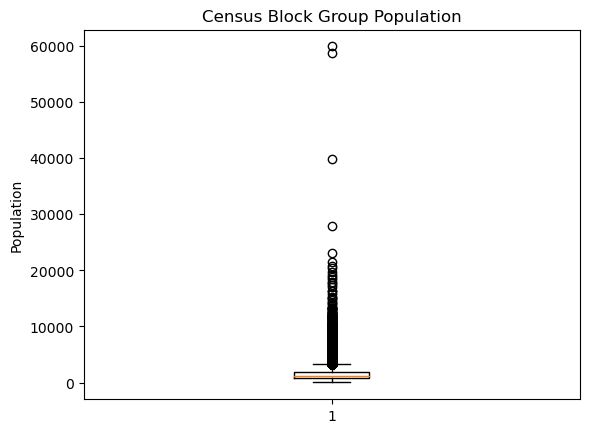

count    63733.000000
mean      1497.084226
std       1118.052648
min          4.000000
25%        865.000000
50%       1242.000000
75%       1816.000000
max      59947.000000
Name: TotalPopulation, dtype: float64

In [2]:
import matplotlib.pyplot as plt

combinedData = pd.read_csv('CombinedData.csv')

#make a box and whisker plot of census block group populations
plt.boxplot(combinedData.TotalPopulation)
plt.title('Census Block Group Population')
plt.ylabel('Population')
plt.show()
combinedData.TotalPopulation.describe()

Use this code to generate dataframes for each of the quartiles (first 25% of data, next 25% of data, etc.) based on population.

E.g. if the block group data were:

| Total Population | Walkability Index |
|------------------|-------------------|
| 100 | 10 |
| 256 | 10.1 | 
| 385 | 10.2 |
| 412 | 10.3 |
| 580 | 10.4 | 
| 663 | 10.5 |
| 747 | 10.6 |
| 808 | 10.7 |

The data frame with the second quartile (here designated by the variable 'Q2Data') would be:

| Total Population | Walkability Index |
|------------------|-------------------|
| 385 | 10.2 |
| 412 | 10.3 |

In [3]:
combinedData = pd.read_csv('CombinedData.csv')

Q1Data = combinedData[combinedData['TotalPopulation'] < 865]
Q2Data = combinedData[(combinedData['TotalPopulation'] >= 865) & (combinedData['TotalPopulation'] < 1242)]
Q3Data = combinedData[(combinedData['TotalPopulation'] >= 1242) & (combinedData['TotalPopulation'] < 1816)]
Q4Data = combinedData[combinedData['TotalPopulation'] >= 1816]

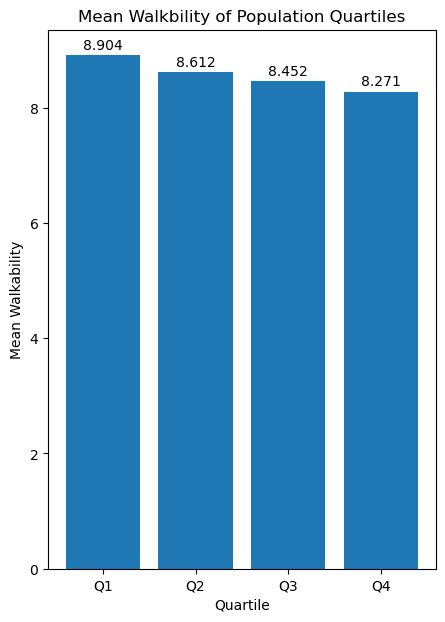

In [4]:
##Graph bar plot of mean walkability for each quartile
import matplotlib.pyplot as plt

quarters = ['Q1', 'Q2', 'Q3', 'Q4']
total_population_means = [Q1Data['NatWalkInd'].mean(), Q2Data['NatWalkInd'].mean(), Q3Data['NatWalkInd'].mean(), Q4Data['NatWalkInd'].mean()]

plt.figure(figsize=(5,7))
plt.bar(quarters, total_population_means)


for q, ave in enumerate(total_population_means):
    plt.text(q, ave + 0.3, f'{ave:.3f}', ha = 'center', va = 'top')

plt.xlabel('Quartile')
plt.ylabel('Mean Walkability')
plt.title('Mean Walkbility of Population Quartiles')
plt.show()

C:\Users\oliver\AppData\Local\Temp\ipykernel_19316\4278744905.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(combinedData['NatWalkInd'], combinedData['TotalPopulation'], c = combinedData['QuartileIndex'], cmap = plt.cm.get_cmap('tab10_r', 4), alpha=0.3)


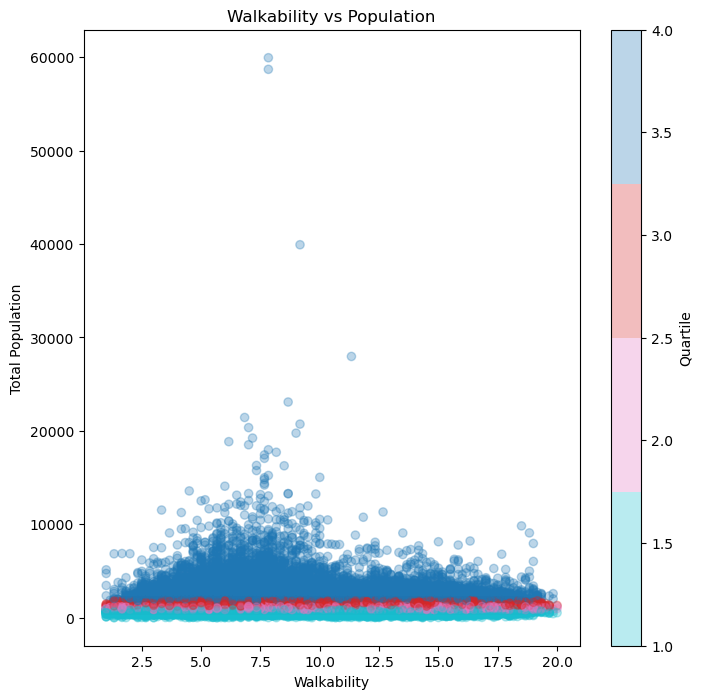

In [5]:
#Add quartile index column
quartileIndex = []
for i in range(combinedData.shape[0]):
    if combinedData.iat[i, 118] < 865:
        quartileIndex.append(1)
    elif combinedData.iat[i, 118] < 1242:
        quartileIndex.append(2)
    elif combinedData.iat[i, 118] < 1816:
        quartileIndex.append(3)
    elif combinedData.iat[i,118] >= 1816:
        quartileIndex.append(4)
combinedData['QuartileIndex'] = quartileIndex

#plot walkability vs population
plt.figure(figsize=(8,8))
plt.scatter(combinedData['NatWalkInd'], combinedData['TotalPopulation'], c = combinedData['QuartileIndex'], cmap = plt.cm.get_cmap('tab10_r', 4), alpha=0.3)
plt.xlabel('Walkability')
plt.ylabel('Total Population')
plt.colorbar(label='Quartile')
plt.title('Walkability vs Population')
plt.show()

C:\Users\oliver\AppData\Local\Temp\ipykernel_19316\2011036640.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(q12['NatWalkInd'], q12['TotalPopulation'], c = q12['QuartileIndex'], cmap = plt.cm.get_cmap('tab10_r', 2), alpha=0.3)


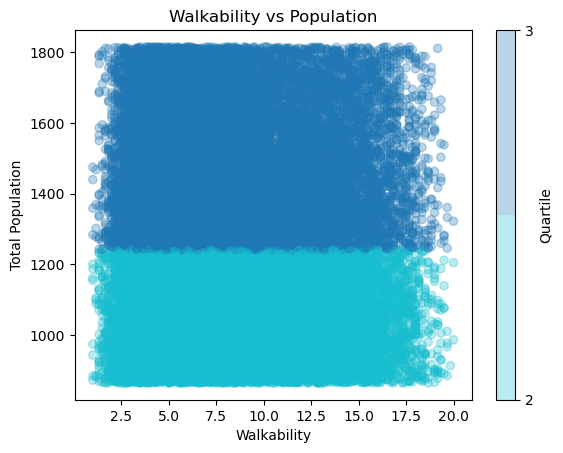

In [6]:
q12 = combinedData[(combinedData['QuartileIndex'] >= 2) & (combinedData['QuartileIndex'] <= 3)]
plt.scatter(q12['NatWalkInd'], q12['TotalPopulation'], c = q12['QuartileIndex'], cmap = plt.cm.get_cmap('tab10_r', 2), alpha=0.3)
plt.xlabel('Walkability')
plt.ylabel('Total Population')
cbar = plt.colorbar(label='Quartile')
cbar.set_ticks([2, 3])
plt.title('Walkability vs Population')
plt.show()

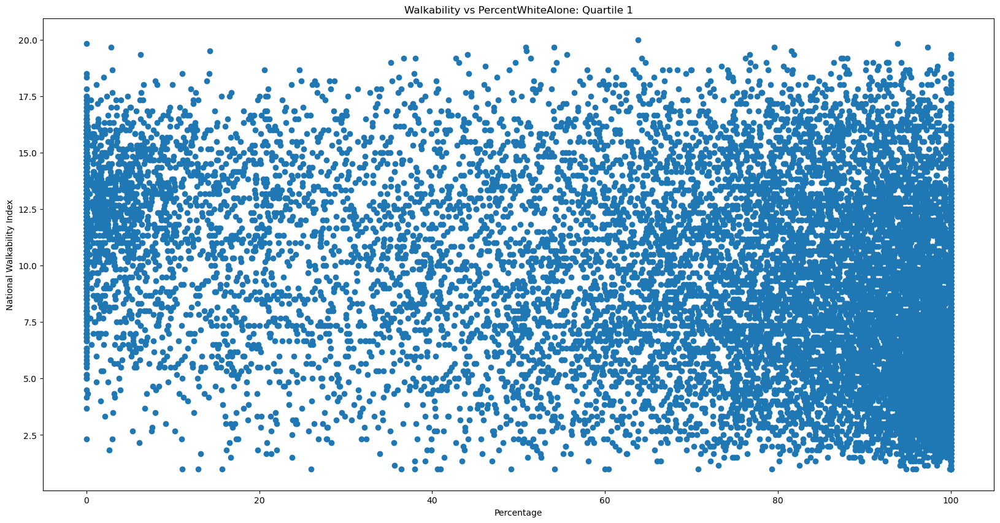

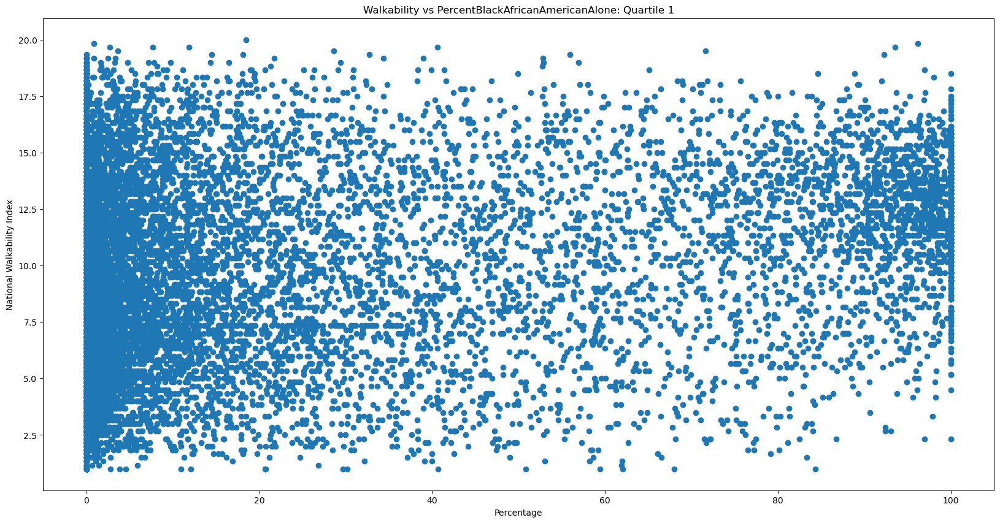

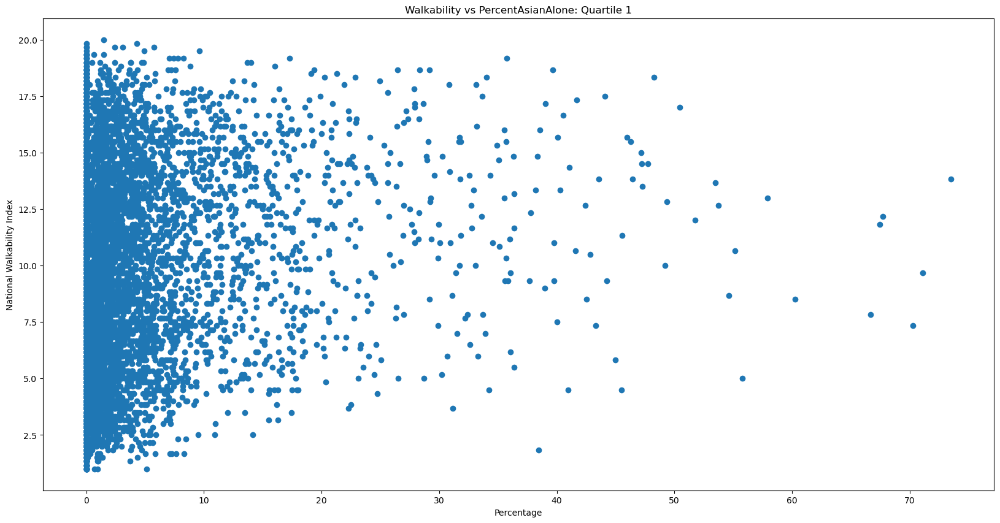

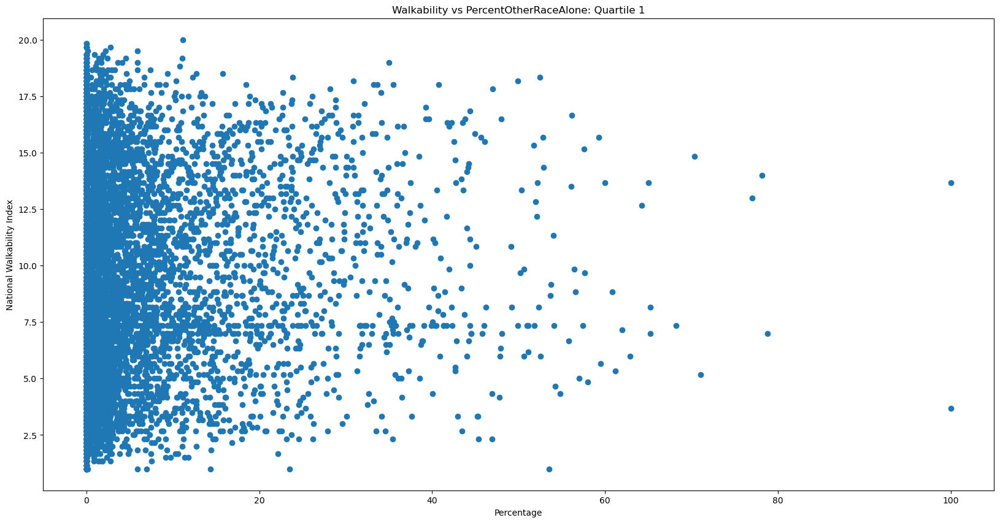

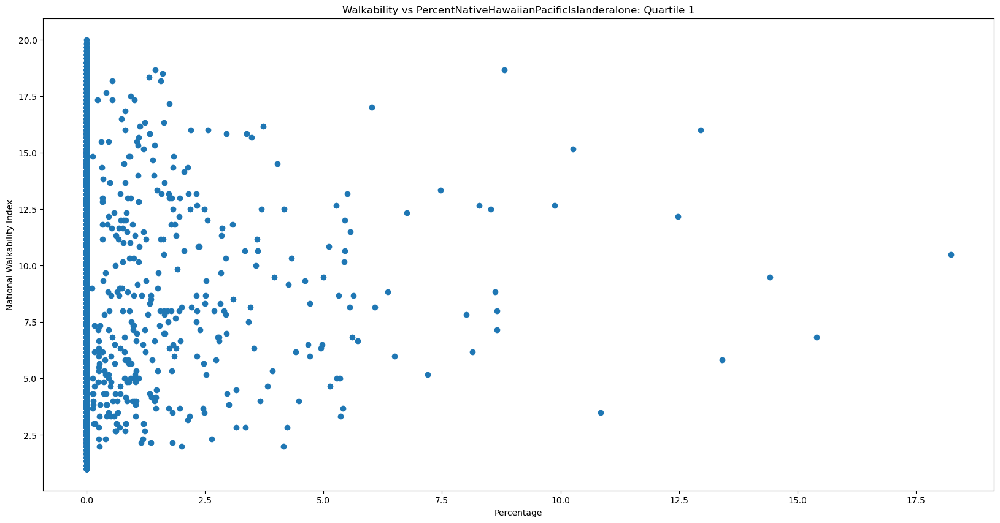

...

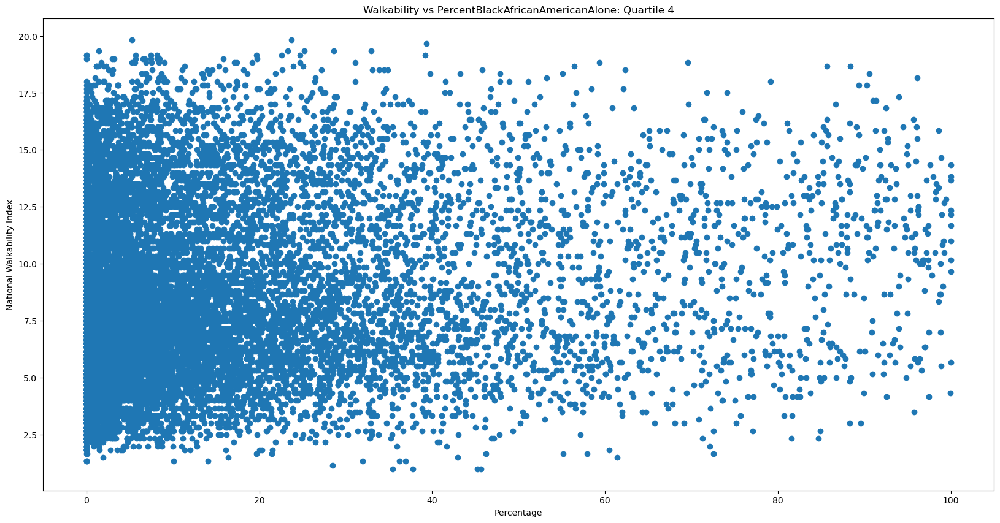

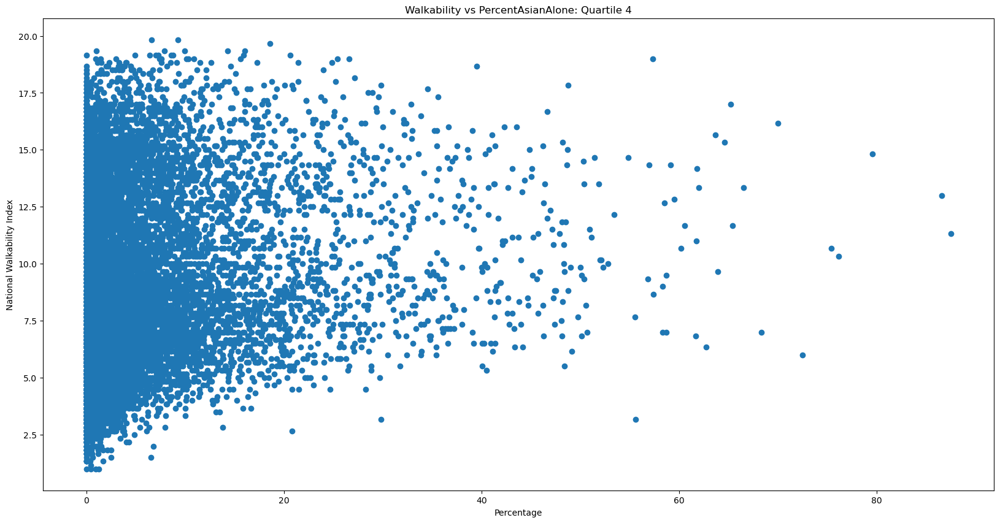

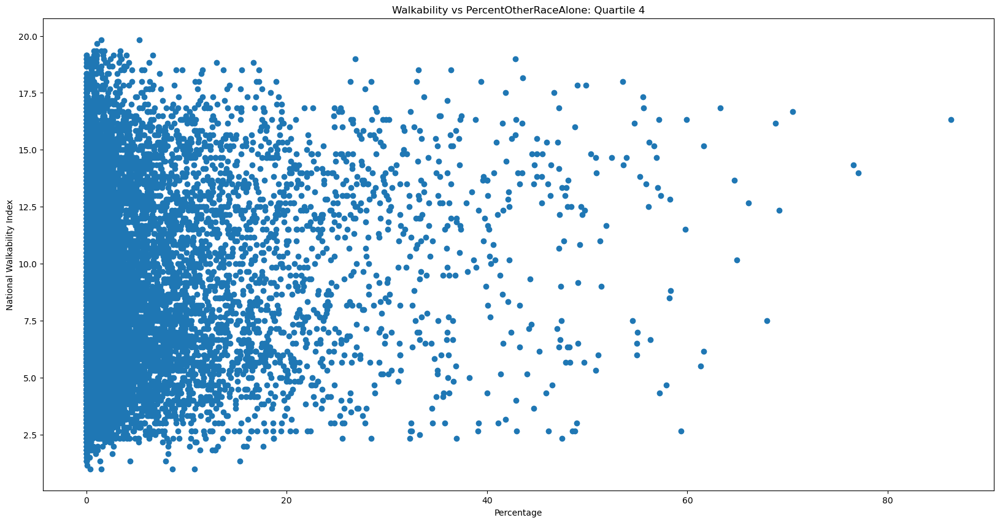

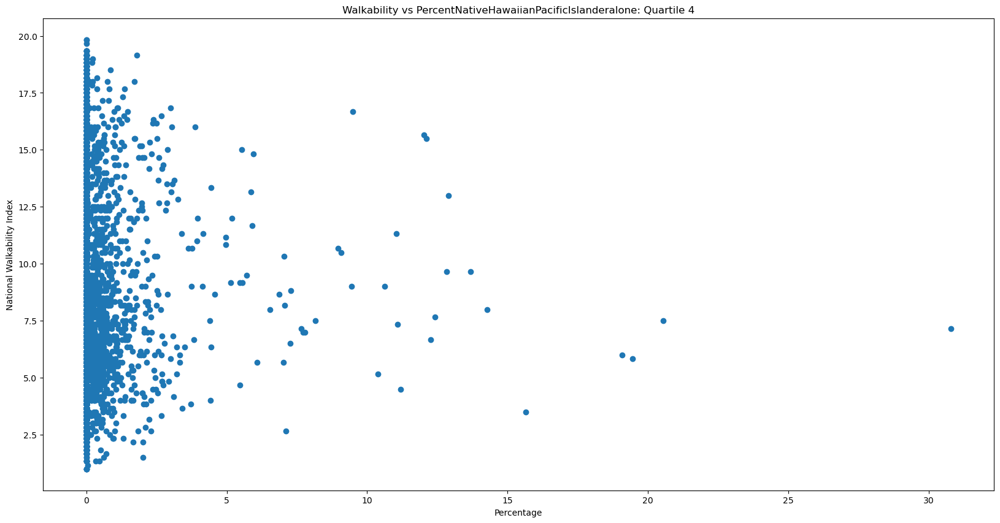

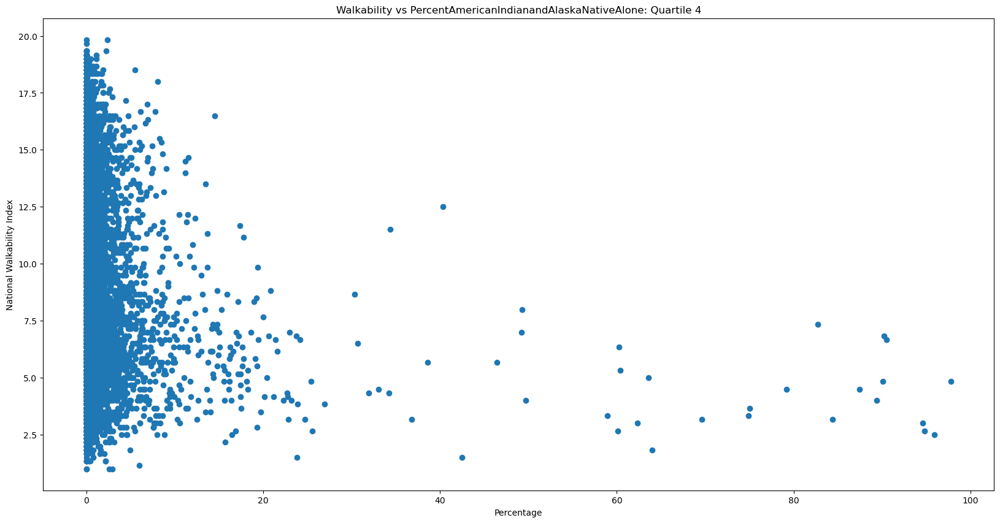

In [7]:
#make individual graphs for each demographic in each quartile

racial_groups = ['PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone', 'PercentAsianAlone', 'PercentOtherRaceAlone', 
                 'PercentNativeHawaiianPacificIslanderalone', 'PercentAmericanIndianandAlaskaNativeAlone']
for name, quartile in {'Quartile 1': Q1Data, 'Quartile 2': Q2Data, 'Quartile 3': Q3Data, 'Quartile 4': Q4Data}.items():
    for group in racial_groups:
        fig, ax = plt.subplots(figsize=(20,10))
        ax.set_xlabel('Percentage')
        ax.set_ylabel('National Walkability Index')
        ax.scatter(quartile[group], quartile['NatWalkInd'])
        ax.set_title(f'Walkability vs {group}: {name}')
        plt.savefig(f'{group}.{name}.png')
        plt.show()

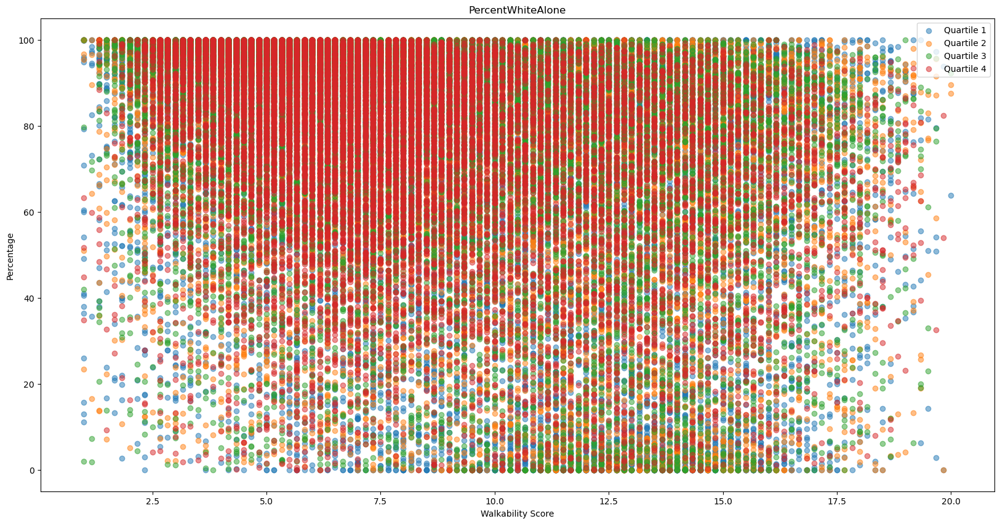

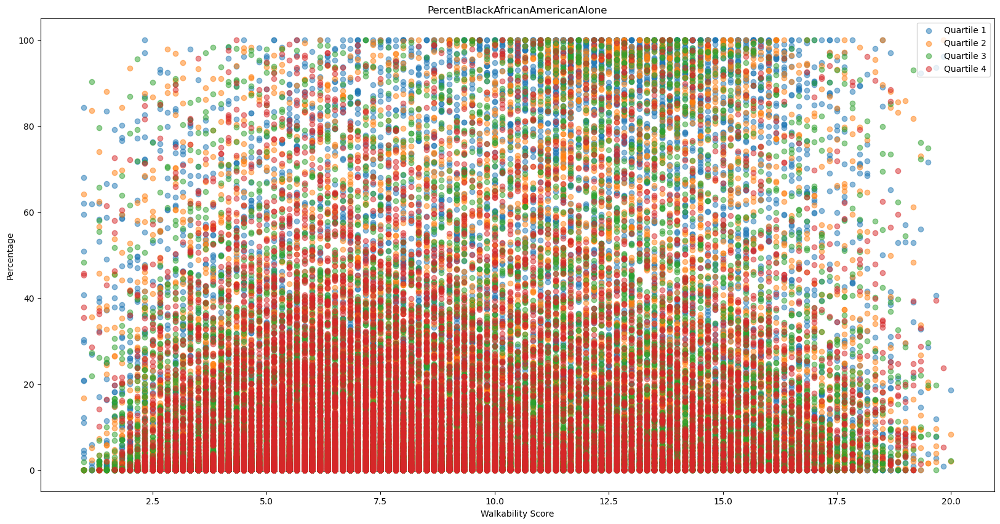

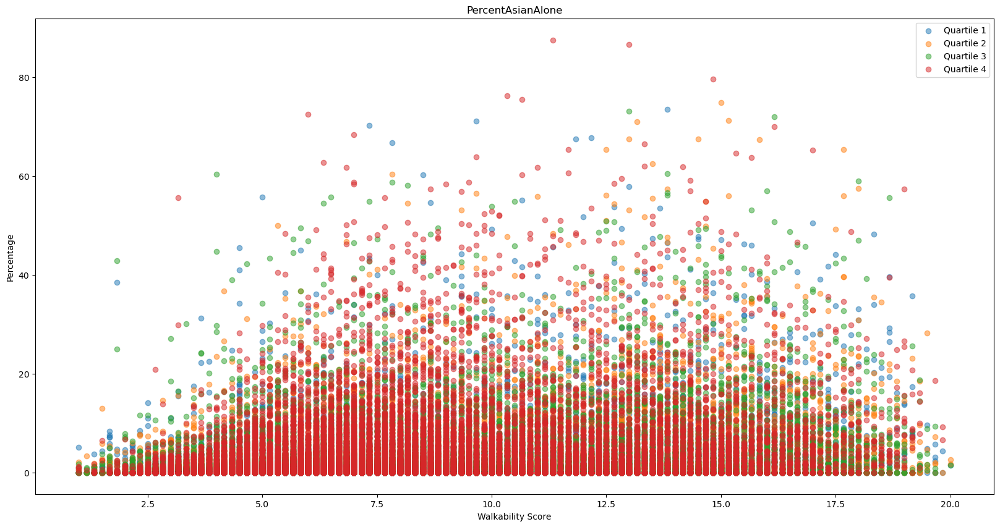

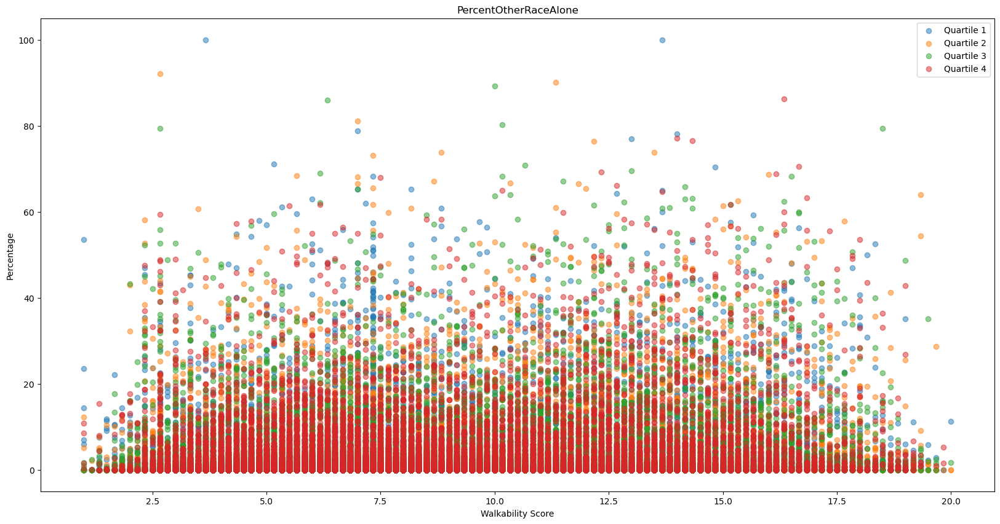

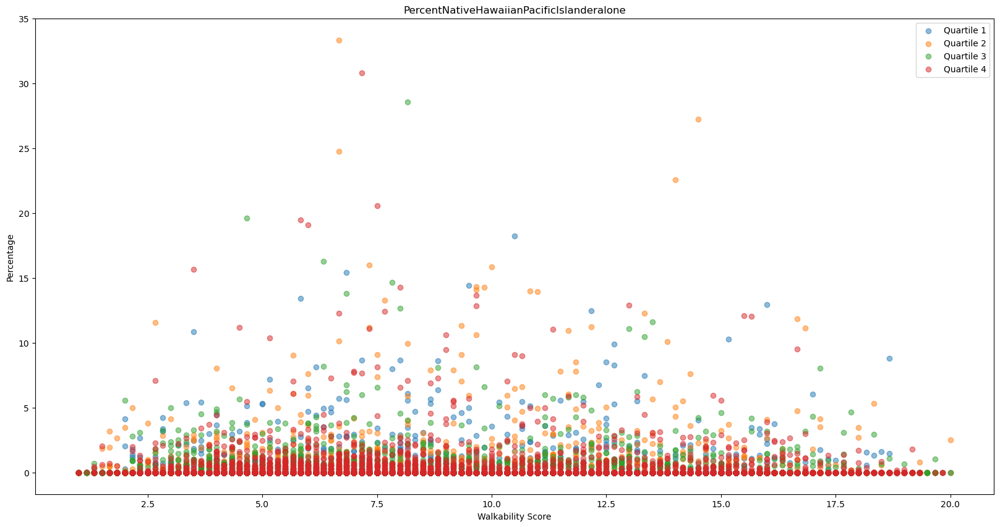

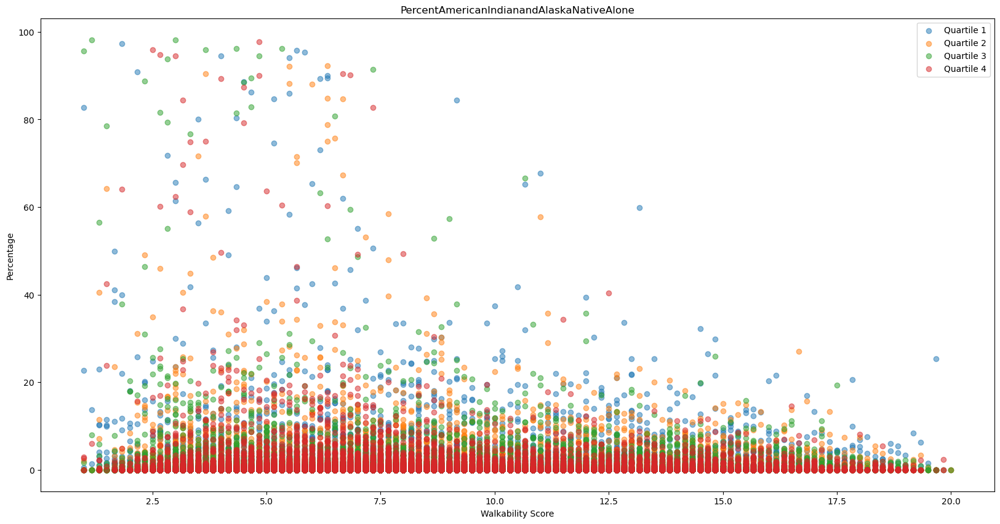

In [8]:
# Plot walkability vs. percentage of each race for each quartile in separate figures
for group in racial_groups:
    # Create a new figure for each racial group
    fig, ax = plt.subplots(figsize=(20, 10))
    
    ax.set_xlabel('Walkability Score')
    ax.set_ylabel('Percentage')
    
    # Plot walkability vs. percentage of the current racial group for each quartile
    for name, quartile in {'Quartile 1': Q1Data, 'Quartile 2': Q2Data, 'Quartile 3': Q3Data, 'Quartile 4': Q4Data}.items():
        ax.scatter(quartile['NatWalkInd'], quartile[group], label=f'{name}', alpha = 0.5)
    
        ax.legend(loc='upper right')
        ax.set_title(f'{group}')
        plt.savefig(f'{group}.png')
    
    # Show the figure for the current racial group
    plt.show()

In [9]:
from sklearn.model_selection import train_test_split

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
dataFeatures = combinedData.loc[:,['TotalPopulation', 'PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone',
                                 'PercentAsianAlone', 'PercentOtherRaceAlone', 'PercentNativeHawaiianPacificIslanderalone',
                                 'PercentAmericanIndianandAlaskaNativeAlone']]

dataTargets = combinedData.loc[:, 'NatWalkInd']

##split data for training and testing
X_train, X_test, y_train, y_test = train_test_split(dataFeatures, dataTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=X_train, y=y_train)

LinearRegression()

Coefficient of determination: 0.1563343667687347


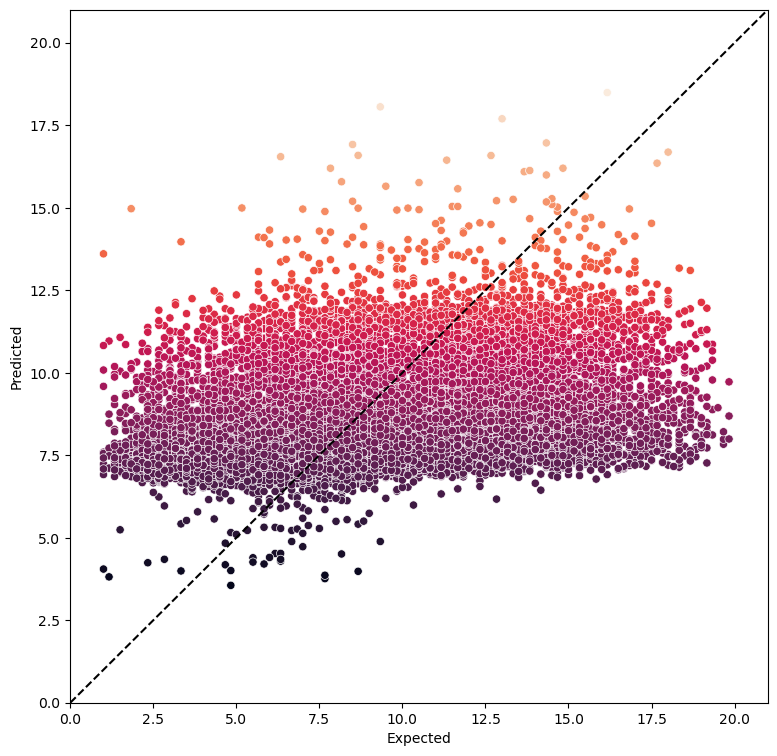

In [10]:
##Evaluate the predictions
predicted = linear_regression.predict(X_test)
expected = y_test

evaluateModel = pd.DataFrame({'Expected': expected, 'Predicted': predicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=evaluateModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)

line = plt.plot([0,21], [0,21], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(expected, predicted)}')

Coefficient of determination: 0.14865477245372383


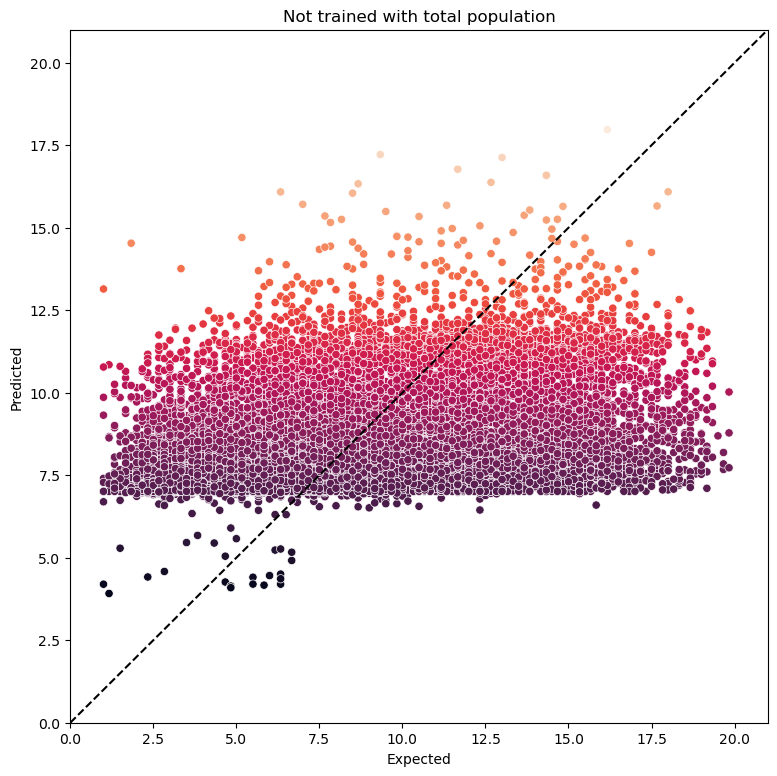

In [11]:
##Retry machine learning without providing total population as a feature

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
noPopFeatures = combinedData.loc[:,['PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone',
                                 'PercentAsianAlone', 'PercentOtherRaceAlone', 'PercentNativeHawaiianPacificIslanderalone',
                                 'PercentAmericanIndianandAlaskaNativeAlone']]

noPopTargets = combinedData.loc[:, 'NatWalkInd']

##split data for training and testing
noPop_X_train, noPop_X_test, noPop_y_train, noPop_y_test = train_test_split(noPopFeatures, noPopTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=noPop_X_train, y=noPop_y_train)

##Evaluate the predictions
noPopPredicted = linear_regression.predict(noPop_X_test)
noPopExpected = noPop_y_test

noPopEvaluateModel = pd.DataFrame({'Expected': noPopExpected, 'Predicted': noPopPredicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=noPopEvaluateModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)
axes.set(title = 'Not trained with total population')

line = plt.plot([0,21], [0,21], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(noPopExpected, noPopPredicted)}')

Coefficient of determination: 0.09028024360181297


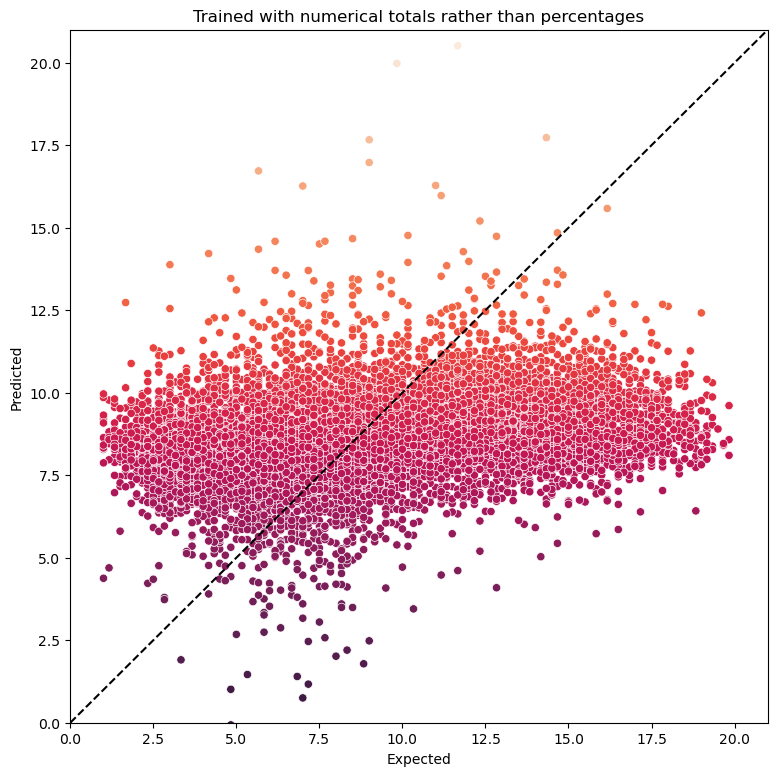

In [12]:
##Retry machine learning without providing numerical totals of each racial demographic rather than percentages

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
noPctFeatures = combinedData.loc[:,['TotalPopulation', 'Estimate!!Total:!!White alone', 'Estimate!!Total:!!Black or African American alone',
                                 'Estimate!!Total:!!Asian alone', 'Estimate!!Total:!!Some other race alone', 'Estimate!!Total:!!Native Hawaiian and Other Pacific Islander alone',
                                 'Estimate!!Total:!!American Indian and Alaska Native alone']]

noPctTargets = combinedData.loc[:, 'NatWalkInd']

##split data for training and testing
noPct_X_train, noPct_X_test, noPct_y_train, noPct_y_test = train_test_split(noPctFeatures, noPctTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=noPct_X_train, y=noPct_y_train)

##Evaluate the predictions
noPctPredicted = linear_regression.predict(noPct_X_test)
noPctExpected = noPct_y_test

noPctEvaluateModel = pd.DataFrame({'Expected': noPctExpected, 'Predicted': noPctPredicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=noPctEvaluateModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)
axes.set(title = 'Trained with numerical totals rather than percentages')

line = plt.plot([0,21], [0,21], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(noPctExpected, noPctPredicted)}')

Coefficient of determination: 0.13077379746974915


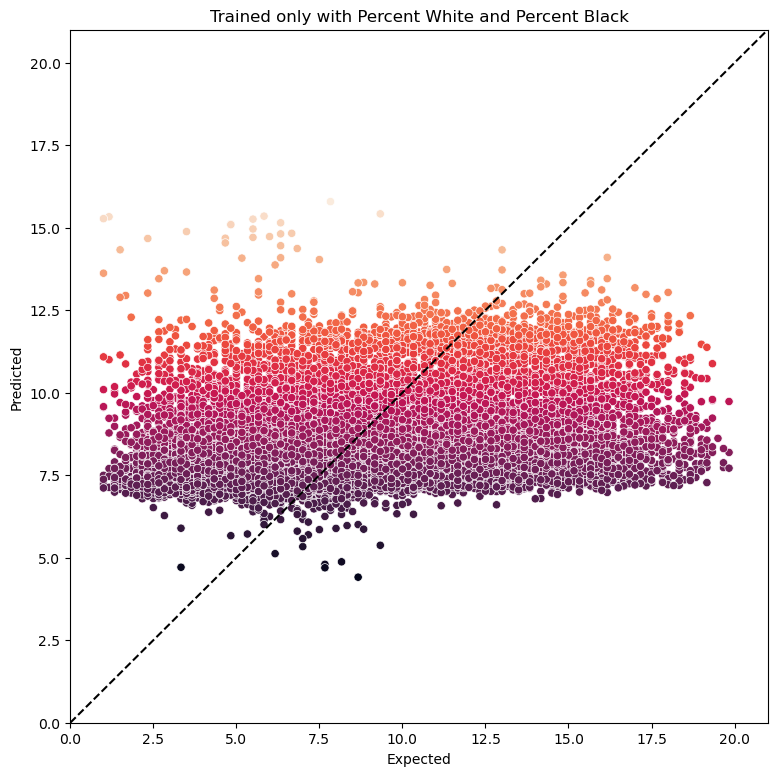

In [13]:
##Machine learning using only percent white and percent black as features

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
bwFeatures = combinedData.loc[:,['TotalPopulation', 'PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone']]

bwTargets = combinedData.loc[:, 'NatWalkInd']

##split data for training and testing
bw_X_train, bw_X_test, bw_y_train, bw_y_test = train_test_split(bwFeatures, bwTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=bw_X_train, y=bw_y_train)

##Evaluate the predictions
bwPredicted = linear_regression.predict(bw_X_test)
bwExpected = bw_y_test

bwEvaluateModel = pd.DataFrame({'Expected': bwExpected, 'Predicted': bwPredicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=bwEvaluateModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)
axes.set(title = 'Trained only with Percent White and Percent Black')


line = plt.plot([0,21], [0,21], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(bwExpected, bwPredicted)}')

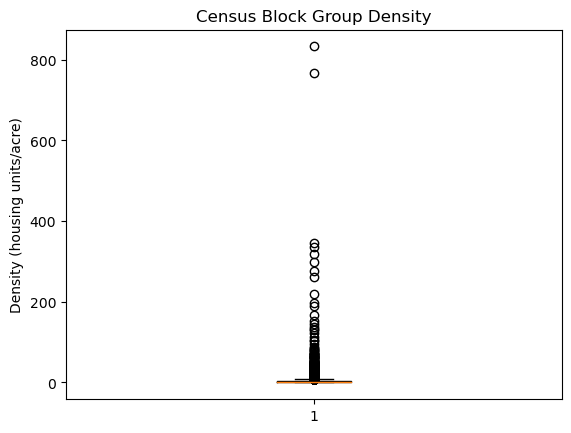

count    63733.000000
mean         2.619742
std          7.184303
min          0.000000
25%          0.174426
50%          1.348623
75%          3.163622
max        832.994360
Name: D1A, dtype: float64

In [14]:
#make a box and whisker plot of household density
plt.boxplot(combinedData.D1A)
plt.title('Census Block Group Density')
plt.ylabel('Density (housing units/acre)')
plt.show()
combinedData.D1A.describe()

Coefficient of determination: 0.04045468425591603


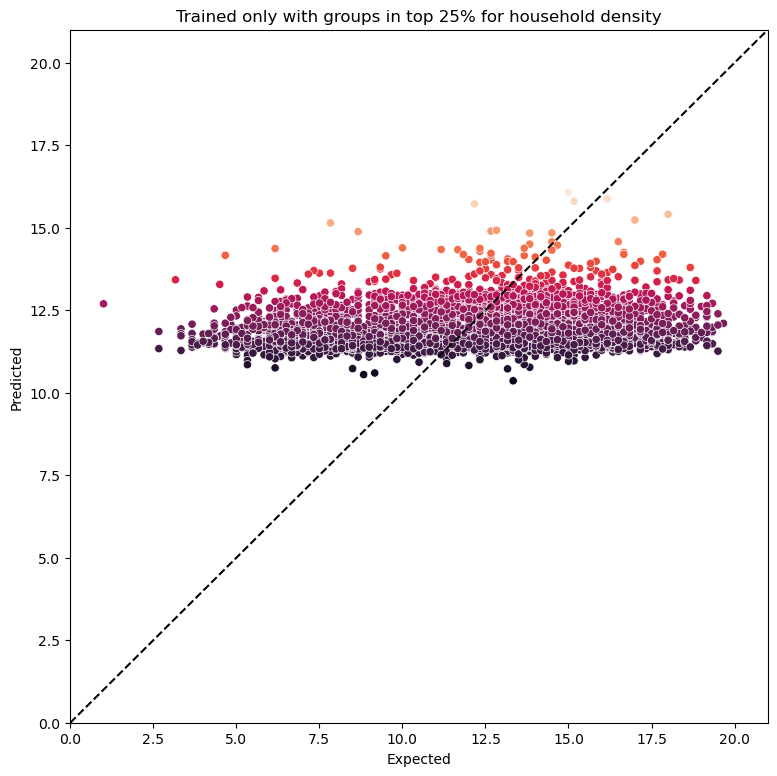

In [15]:
##Machine learning on data in the top 75% of household density (household units/acre)
Q4DensityData = combinedData[combinedData['D1A'] > 3.163622]

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
denseFeatures = Q4DensityData.loc[:,['TotalPopulation', 'PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone',
                                 'PercentAsianAlone', 'PercentOtherRaceAlone', 'PercentNativeHawaiianPacificIslanderalone',
                                 'PercentAmericanIndianandAlaskaNativeAlone']]

denseTargets = Q4DensityData.loc[:, 'NatWalkInd']

##split data for training and testing
dense_X_train, dense_X_test, dense_y_train, dense_y_test = train_test_split(denseFeatures, denseTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=dense_X_train, y=dense_y_train)

##Evaluate the predictions
densePredicted = linear_regression.predict(dense_X_test)
denseExpected = dense_y_test

evaluateDenseModel = pd.DataFrame({'Expected': denseExpected, 'Predicted': densePredicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=evaluateDenseModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)
axes.set(title = 'Trained only with groups in top 25% for household density')

line = plt.plot([0,21], [0,21], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(denseExpected, densePredicted)}')

Coefficient of determination: 0.08561081506202028


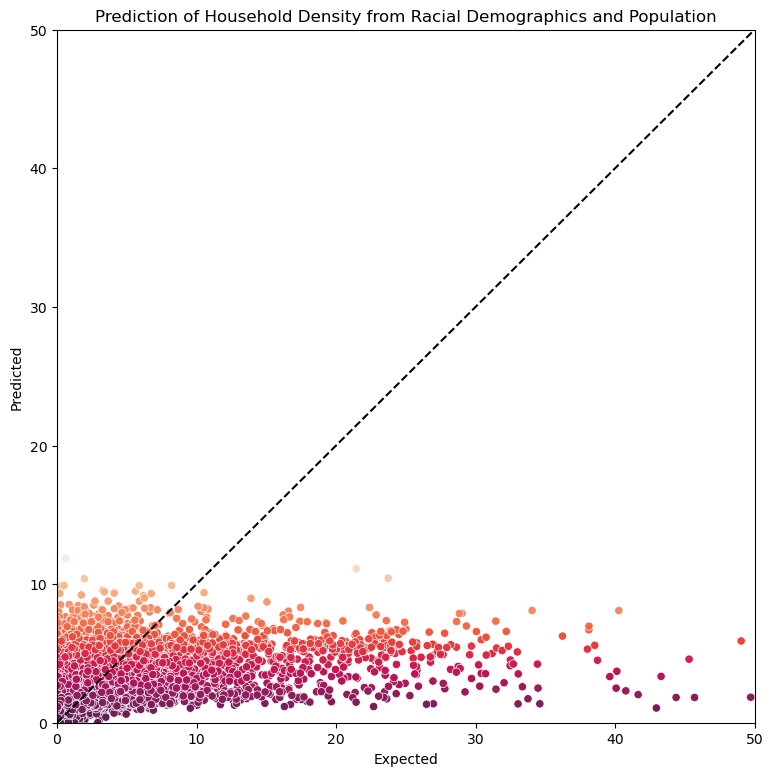

In [16]:
##

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
hDensityFeatures = combinedData.loc[:,['TotalPopulation', 'PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone',
                                 'PercentAsianAlone', 'PercentOtherRaceAlone', 'PercentNativeHawaiianPacificIslanderalone',
                                 'PercentAmericanIndianandAlaskaNativeAlone']]

hDensityTargets = combinedData.loc[:, 'D1A']

##split data for training and testing
hDensity_X_train, hDensity_X_test, hDensity_y_train, hDensity_y_test = train_test_split(hDensityFeatures, hDensityTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=hDensity_X_train, y=hDensity_y_train)

##Evaluate the predictions
hDensityPredicted = linear_regression.predict(hDensity_X_test)
hDensityExpected = hDensity_y_test

hDensityEvaluateModel = pd.DataFrame({'Expected': hDensityExpected, 'Predicted': hDensityPredicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=hDensityEvaluateModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0, 50)
axes.set_ylim(0, 50)
axes.set(title = 'Prediction of Household Density from Racial Demographics and Population')


line = plt.plot([0, 50], [0, 50], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(hDensityExpected, hDensityPredicted)}')

In [17]:
hDensityTargets.describe()

count    63733.000000
mean         2.619742
std          7.184303
min          0.000000
25%          0.174426
50%          1.348623
75%          3.163622
max        832.994360
Name: D1A, dtype: float64

Coefficient of determination: 0.12332946337073447


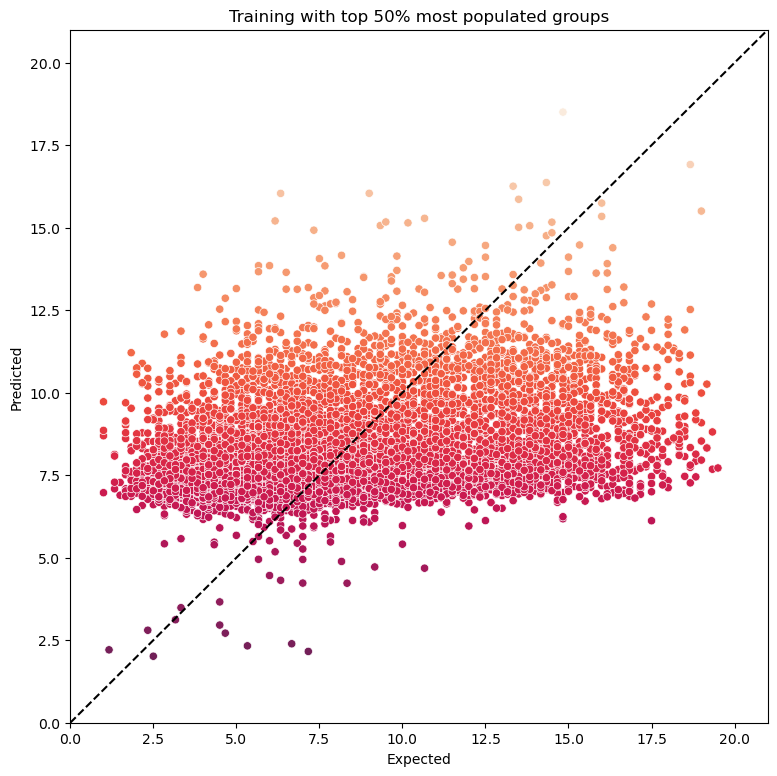

In [18]:
##Machine learning on data in the top 50% of total population
topHalfPopData = combinedData[combinedData['TotalPopulation'] > 1242]

##create new dataframes with features (block group population and racial demographics) and targets (walkability index) for machine learning
highPopFeatures = topHalfPopData.loc[:,['TotalPopulation', 'PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone',
                                 'PercentAsianAlone', 'PercentOtherRaceAlone', 'PercentNativeHawaiianPacificIslanderalone',
                                 'PercentAmericanIndianandAlaskaNativeAlone']]

highPopTargets = topHalfPopData.loc[:, 'NatWalkInd']

##split data for training and testing
highPop_X_train, highPop_X_test, highPop_y_train, highPop_y_test = train_test_split(highPopFeatures, highPopTargets, random_state=11)

##import estimator for k-nearest neighbors algorithm
from sklearn.linear_model import LinearRegression
linear_regression = LinearRegression()

##load the data
linear_regression.fit(X=highPop_X_train, y=highPop_y_train)

##Evaluate the predictions
highPopPredicted = linear_regression.predict(highPop_X_test)
highPopExpected = highPop_y_test

evaluateHighPopModel = pd.DataFrame({'Expected': highPopExpected, 'Predicted': highPopPredicted})

#plot predicted vs expected values
import seaborn as sns

modelEvaluationFigure = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=evaluateHighPopModel, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)
axes.set(title = 'Training with top 50% most populated groups')

line = plt.plot([0,21], [0,21], 'k--')

#Metrics for regression estimators
from sklearn import metrics
print(f'Coefficient of determination: {metrics.r2_score(highPopExpected, highPopPredicted)}')

(0.0, 21.0)

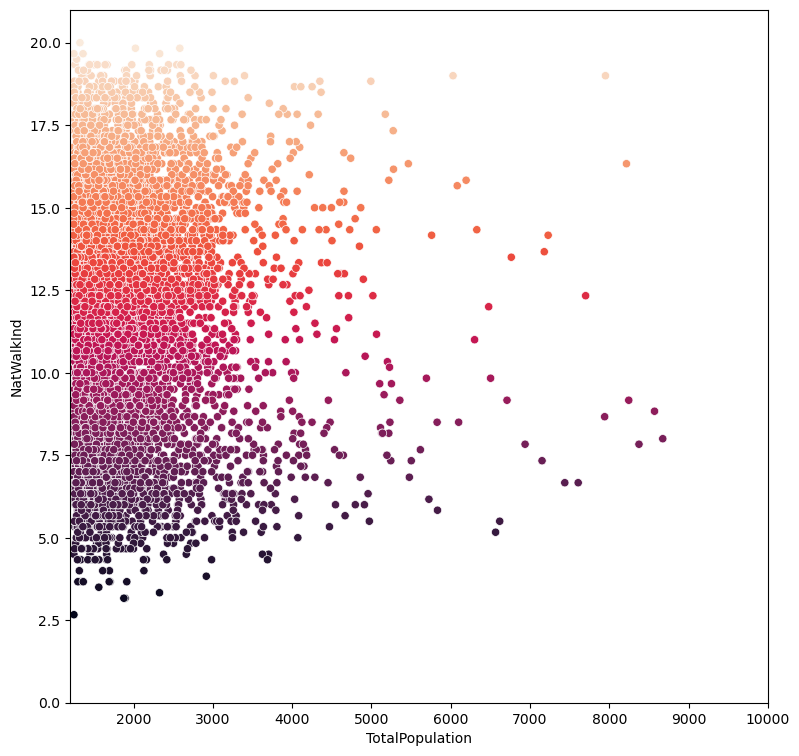

In [19]:
lowPopDense = combinedData[(combinedData['D1A'] > 3.163622) & (combinedData['TotalPopulation'] > 1242)]
populationAndWalkability = lowPopDense.loc[:, ['TotalPopulation', 'NatWalkInd']]

popVersusWalk = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=populationAndWalkability, 
                       x = 'TotalPopulation',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(1200, 10000)
axes.set_ylim(0,21)

In [20]:
from sklearn.linear_model import ElasticNet, Lasso, Ridge
estimators = [linear_regression, ElasticNet(), Lasso(), Ridge()]

from sklearn.model_selection import KFold, cross_val_score

r2Mean = []

for e in estimators:
    kf = KFold(n_splits = 10, random_state = 11, shuffle = True)
    scores = cross_val_score(estimator = e,
                             X = dataFeatures,
                             y = dataTargets,
                             cv = kf,
                             scoring = 'r2')
    r2Mean.append(scores.mean())
    
estimatorComparison = pd.DataFrame({"Mean r^2": r2Mean})
estimatorComparison.index = ['LinearRegression', 'ElasticNet', 'Lasso', 'Ridge']

estimatorComparison

,Mean r^2
LinearRegression,0.152784
ElasticNet,0.149881
Lasso,0.144882
Ridge,0.152784


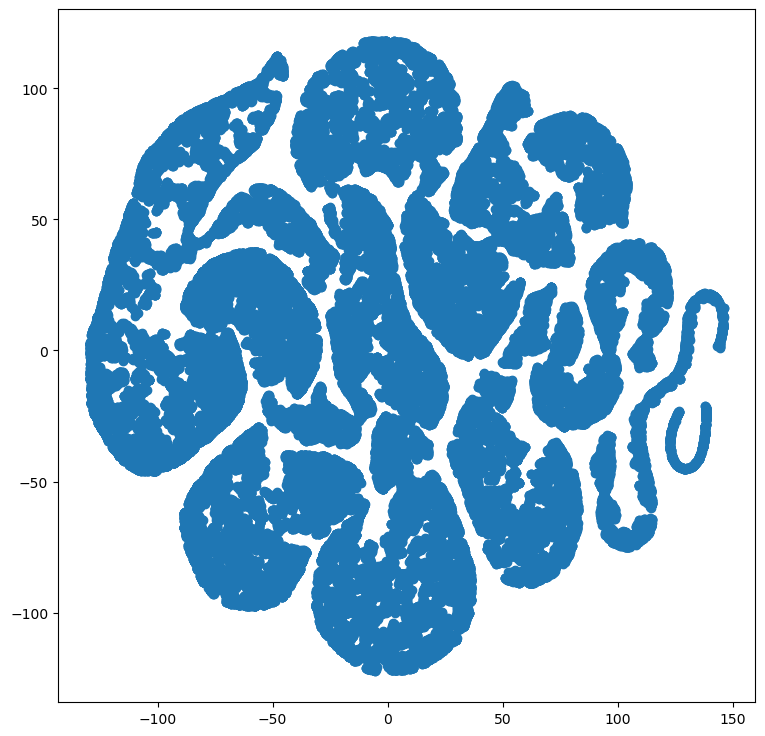

In [21]:
#visualization of reduced data with color; takes a LONG time to run
from sklearn.manifold import TSNE
tsne = TSNE(n_components= 2, random_state = 11)

reducedData = tsne.fit_transform(dataFeatures)

figure = plt.figure(figsize=(9,9))
points = plt.scatter(reducedData[:, 0], reducedData[:, 1])

C:\Users\oliver\AppData\Local\Temp\ipykernel_19316\3973419249.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('nipy_spectral_r', 20))


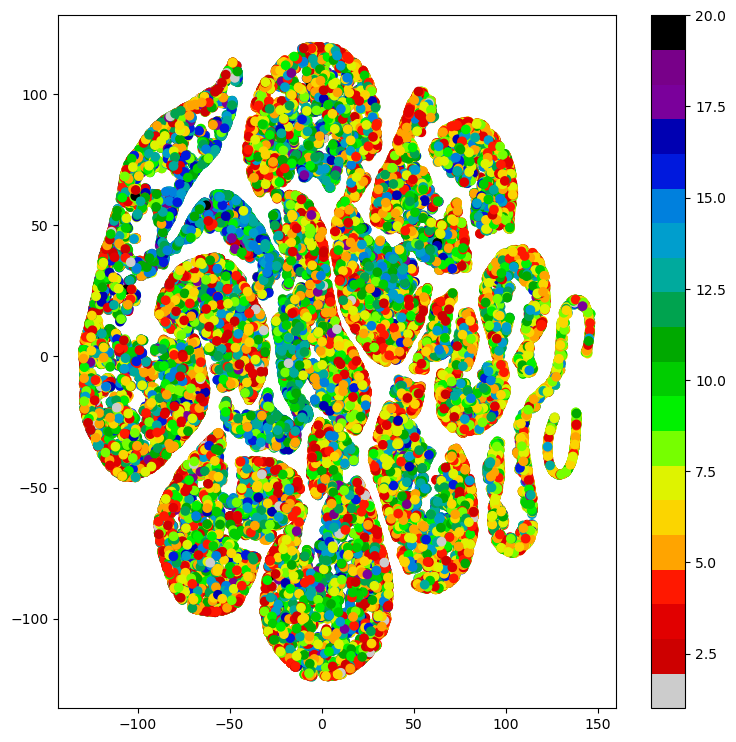

In [22]:
#visualization of reduced data; takes a LONG time to run
from sklearn.manifold import TSNE
tsne = TSNE(n_components= 2, random_state = 11)

reducedData = tsne.fit_transform(dataFeatures)

figure = plt.figure(figsize=(9,9))
points = plt.scatter(reducedData[:, 0], reducedData[:, 1], c=dataTargets, 
                     cmap = plt.cm.get_cmap('nipy_spectral_r', 20))

colorbar = plt.colorbar(points)

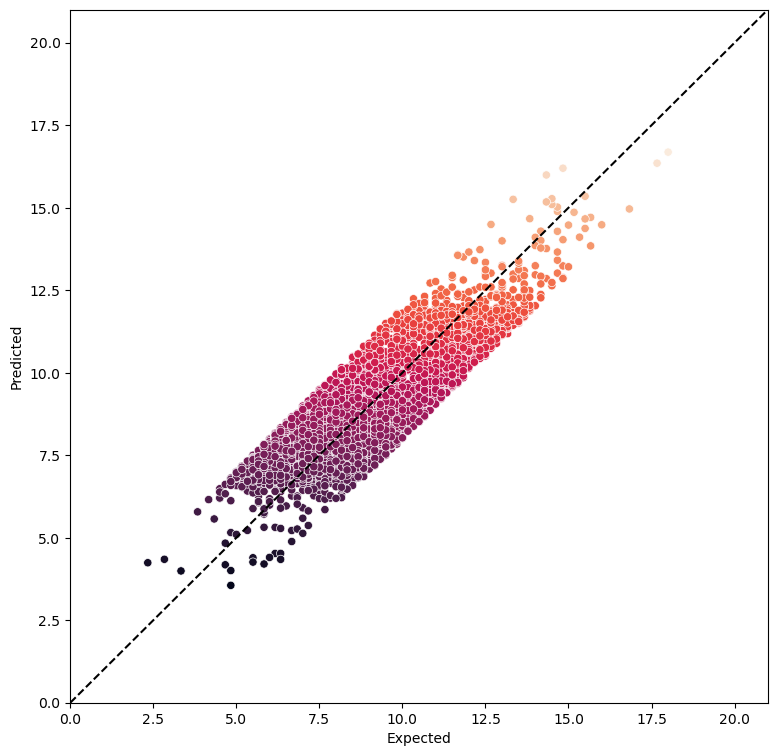

In [23]:
evaluateModel['|Expected - Predicted|'] = abs(evaluateModel['Expected'] - evaluateModel['Predicted'])

lrEvaluate = pd.concat([X_test, evaluateModel], axis = 1)

lrEvaluate = lrEvaluate[lrEvaluate['|Expected - Predicted|'] <= 2]

evaluateAcuratePredictions = plt.figure(figsize=(9,9))
axes = sns.scatterplot(data=lrEvaluate, 
                       x = 'Expected',
                       y = 'Predicted',
                       hue = 'Predicted',
                       palette = 'rocket',
                       legend = False)

axes.set_xlim(0,21)
axes.set_ylim(0,21)

line = plt.plot([0,21], [0,21], 'k--')

In [24]:
lrEvaluate.describe()

,TotalPopulation,PercentWhiteAlone,PercentBlackAfricanAmericanAlone,PercentAsianAlone,PercentOtherRaceAlone,PercentNativeHawaiianPacificIslanderalone,PercentAmericanIndianandAlaskaNativeAlone,Expected,Predicted,|Expected - Predicted|
count,6053.000000,6053.000000,6053.000000,6053.000000,6053.000000,6053.000000,6053.000000,6053.000000,6053.000000,6053.000000
mean,1613.393854,74.840184,16.119233,2.498469,2.811137,0.077557,0.956238,8.342502,8.469874,0.988532
std,1179.563115,28.038174,26.504481,5.503731,6.696229,0.667110,5.368364,2.059694,1.605460,0.572558
min,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.333333,3.556501,0.000142
25%,894.000000,65.527814,0.071633,0.000000,0.000000,0.000000,0.000000,6.833333,7.316500,0.492118
50%,1302.000000,86.131997,3.498542,0.000000,0.000000,0.000000,0.000000,8.000000,7.891963,0.975201
75%,1979.000000,95.126613,17.768924,2.599780,2.372479,0.000000,0.000000,9.500000,9.228252,1.474856
max,13295.000000,100.000000,100.000000,59.014085,77.001704,18.232044,97.769517,18.000000,16.685352,1.999808


Text(0, 0.5, 'Percentage of Block Group Population')

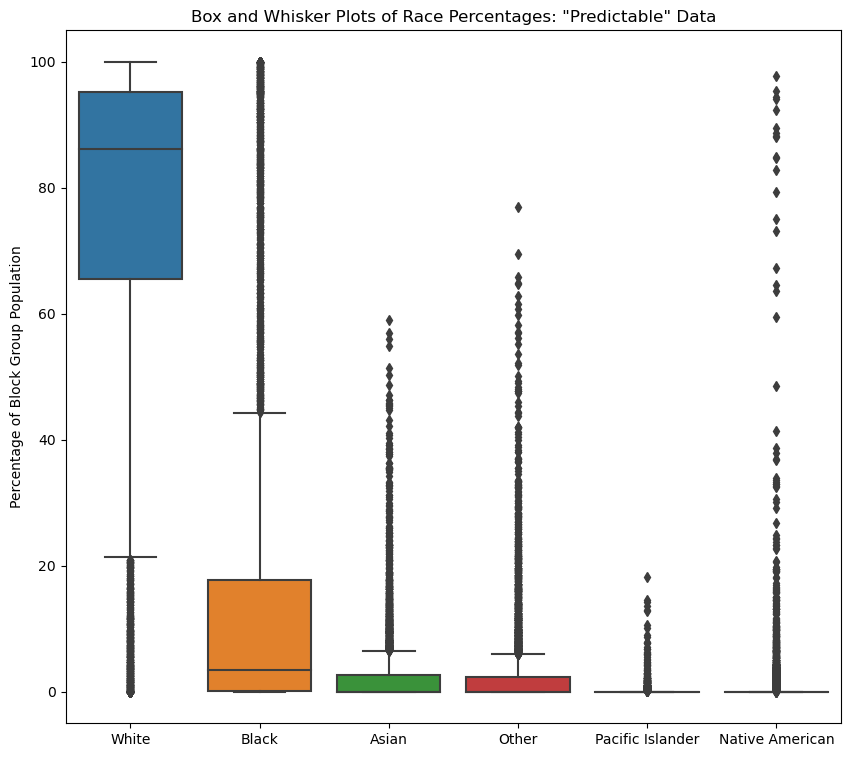

In [25]:
##Create box and whisker plots of accurate predictions
lrEvaluate.columns = ['TotalPopulation', 'White', 'Black', 'Asian', 'Other', 'Pacific Islander', 'Native American', 'Expected', 'Predicted', '|Expected - Predicted|'] 
plt.figure(figsize=(10,9))
sns.boxplot(data = lrEvaluate.loc[:, 'White': 'Native American'])
plt.title('Box and Whisker Plots of Race Percentages: \"Predictable\" Data')
plt.ylabel('Percentage of Block Group Population')

Text(0, 0.5, 'Percentage of Block Group Population')

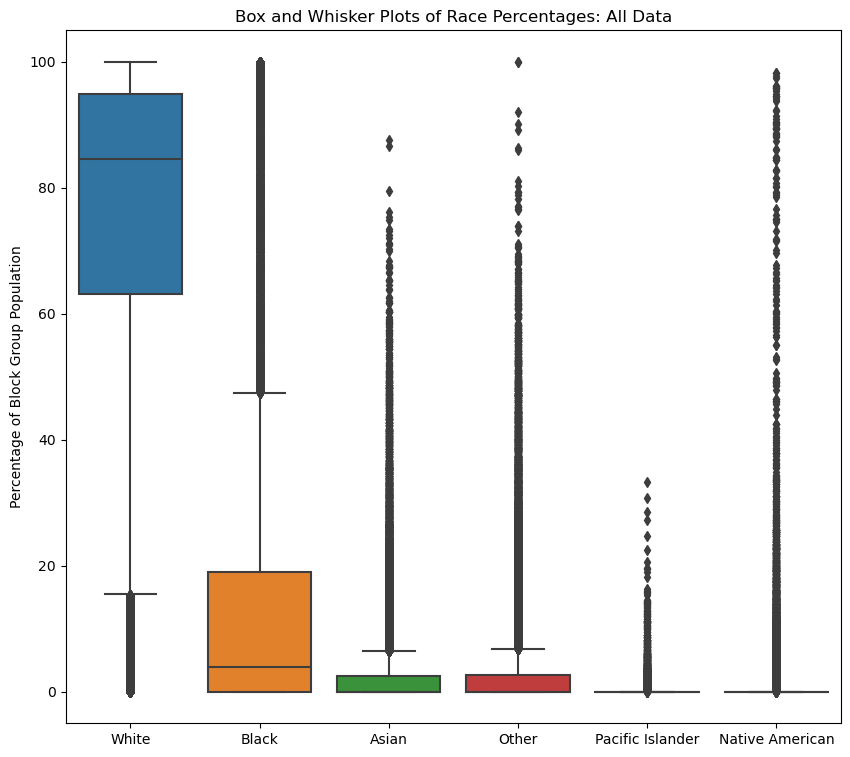

In [26]:
##Create box and whisker plots of all data

featureColumns = combinedData[['Geography', 'TotalPopulation', 'PercentWhiteAlone', 'PercentBlackAfricanAmericanAlone',
                                 'PercentAsianAlone', 'PercentOtherRaceAlone', 'PercentNativeHawaiianPacificIslanderalone',
                                 'PercentAmericanIndianandAlaskaNativeAlone', 'NatWalkInd']]
featureColumns.columns = ['Geography', 'TotalPopulation', 'White', 'Black', 'Asian', 'Other', 'Pacific Islander', 'Native American', 'NatWalkInd']
plt.figure(figsize=(10,9))
sns.boxplot(data = featureColumns.loc[:, 'White': 'Native American'])
plt.title('Box and Whisker Plots of Race Percentages: All Data')
plt.ylabel('Percentage of Block Group Population')

count     6053.000000
mean      1613.393854
std       1179.563115
min          4.000000
25%        894.000000
50%       1302.000000
75%       1979.000000
max      13295.000000
Name: TotalPopulation, dtype: float64

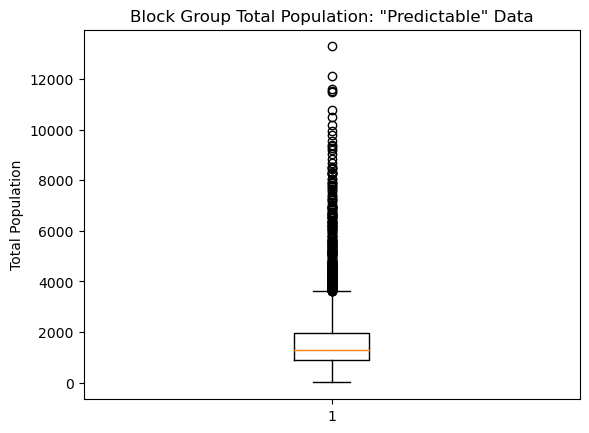

In [27]:
##make a box plot with population data from accurately predicted block groups
plt.boxplot(lrEvaluate['TotalPopulation'])
plt.title('Block Group Total Population: \"Predictable\" Data')
plt.ylabel('Total Population')
lrEvaluate.TotalPopulation.describe()

(0.0, 14000.0)

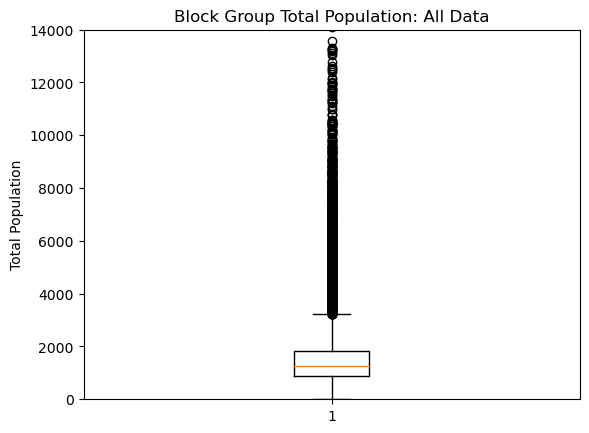

In [28]:
##make a box plot with population data from accurately all data
plt.boxplot(featureColumns['TotalPopulation'])
plt.title('Block Group Total Population: All Data')
plt.ylabel('Total Population')
plt.ylim(0,14000)

In [29]:
##Perform a t-test to determine if mean of population in accurately predicted data is 
#significantly higher than the mean population of all data
import numpy as np
from scipy.stats import ttest_ind

allData = combinedData['TotalPopulation'].to_numpy()
predictableData = lrEvaluate['TotalPopulation'].to_numpy()

t_statistic, p_value = ttest_ind(allData, predictableData)

print('t-statistic: ', t_statistic)
print('p-value: ', p_value)

alpha = 0.05
if p_value < alpha:
    print("The \"predictable\" data's mean population is significantly higher than that of the complete dataset")
else:
    print("The \"predictable\" data's mean population is significantly NOT higher than that of the complete dataset")

t-statistic:  -7.696938758825689
p-value:  1.4118645501822051e-14
The "predictable" data's mean population is significantly higher than that of the complete dataset


[Text(0.5, 1.0, 'Los Angeles Block Groups: Percent White vs Walkability'),
 Text(0.5, 0, 'Percent White'),
 Text(0, 0.5, 'National Walkability Index')]

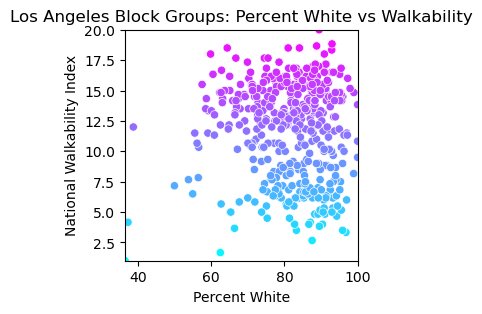

In [30]:
##Filter data for only block groups in Los Angeles county
LA_data = featureColumns[(featureColumns['Geography'] >= 61110001001) & (featureColumns['Geography'] <= 61119800001)]

##plot percent of a given race vs walkability
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data, 
                       x = 'White',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(min(LA_data['White']), max(LA_data['White']))
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'Los Angeles Block Groups: Percent White vs Walkability', xlabel = 'Percent White', ylabel = 'National Walkability Index')

[Text(0.5, 1.0, 'Percent Black vs Walkability'),
 Text(0.5, 0, 'Percent BLack'),
 Text(0, 0.5, 'National Walkability Index')]

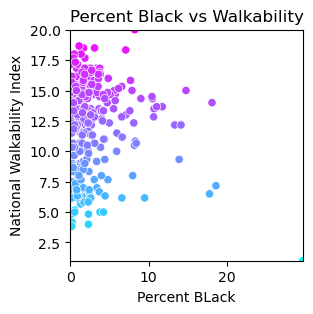

In [31]:
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data[LA_data['Black'] > 0], 
                       x = 'Black',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(min(LA_data['Black']), max(LA_data['Black']))
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'Percent Black vs Walkability', xlabel = 'Percent BLack', ylabel = 'National Walkability Index')

[Text(0.5, 1.0, 'Percent Asian vs Walkability'),
 Text(0.5, 0, 'Percent Asian'),
 Text(0, 0.5, 'National Walkability Index')]

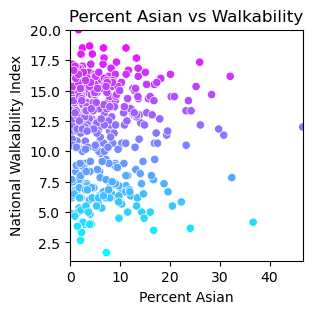

In [32]:
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data[LA_data['Asian'] > 0], 
                       x = 'Asian',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(min(LA_data['Asian']), max(LA_data['Asian']))
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'Percent Asian vs Walkability', xlabel = 'Percent Asian', ylabel = 'National Walkability Index')

[Text(0.5, 1.0, 'Percent Pacific Islander vs Walkability'),
 Text(0.5, 0, 'Percent Pacific Islander'),
 Text(0, 0.5, 'National Walkability Index')]

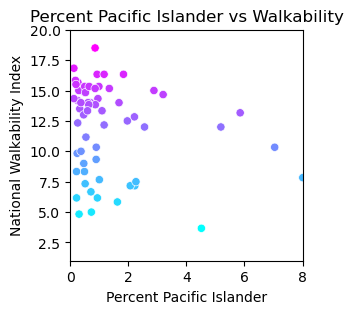

In [33]:
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data[LA_data['Pacific Islander'] > 0], 
                       x = 'Pacific Islander',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(min(LA_data['Pacific Islander']), max(LA_data['Pacific Islander']))
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'Percent Pacific Islander vs Walkability', xlabel = 'Percent Pacific Islander', ylabel = 'National Walkability Index')

[Text(0.5, 1.0, 'Percent Native American vs Walkability'),
 Text(0.5, 0, 'Percent Native American'),
 Text(0, 0.5, 'National Walkability Index')]

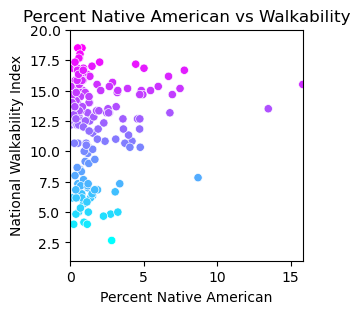

In [34]:
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data[LA_data['Native American'] > 0], 
                       x = 'Native American',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(min(LA_data['Native American']), max(LA_data['Native American']))
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'Percent Native American vs Walkability', xlabel = 'Percent Native American', ylabel = 'National Walkability Index')

[Text(0.5, 1.0, 'Percent "Some Other Race" vs Walkability'),
 Text(0.5, 0, 'Percent "Some Other Race"'),
 Text(0, 0.5, 'National Walkability Index')]

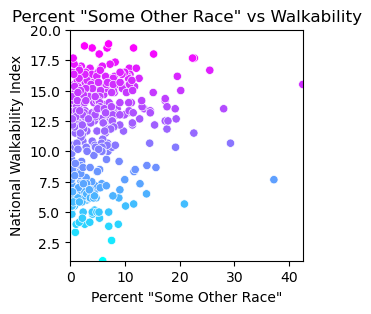

In [35]:
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data[LA_data['Other'] > 0], 
                       x = 'Other',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(min(LA_data['Other']), max(LA_data['Other']))
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'Percent \"Some Other Race\" vs Walkability', xlabel = 'Percent \"Some Other Race\"', ylabel = 'National Walkability Index')

[Text(0.5, 1.0, 'TotalPopulation vs Walkability'),
 Text(0.5, 0, 'TotalPopulation'),
 Text(0, 0.5, 'National Walkability Index')]

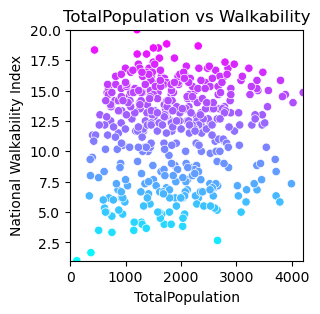

In [36]:
LADataFigure = plt.figure(figsize=(3,3))
axes = sns.scatterplot(data=LA_data[LA_data['TotalPopulation'] > 0], 
                       x = 'TotalPopulation',
                       y = 'NatWalkInd',
                       hue = 'NatWalkInd',
                       palette = 'cool',
                       legend = False)

axes.set_xlim(0, 4200)
axes.set_ylim(min(LA_data['NatWalkInd']), max(LA_data['NatWalkInd']))

axes.set(title = 'TotalPopulation vs Walkability', xlabel = 'TotalPopulation', ylabel = 'National Walkability Index')

In [37]:
##How do the block groups with the highest NWI for each race compare?
maxNWI = []
meanPct = []
percentAtMax = []
diffFromMeanPct = []
relDiff = []

for race in ['White', 'Black', 'Asian', 'Other', 'Pacific Islander', 'Native American']:
    raceSpecificDataLA = LA_data[LA_data[race] > 0]
    maxNWI.append(raceSpecificDataLA['NatWalkInd'].max())
    percentAtMax.append(raceSpecificDataLA.loc[raceSpecificDataLA['NatWalkInd'] == maxNWI[-1], race].values[0])
    meanPct.append(raceSpecificDataLA[race].mean())
    diffFromMeanPct.append(percentAtMax[-1] - raceSpecificDataLA[race].mean())
    relDiff.append(diffFromMeanPct[-1] / meanPct[-1])

LAMaxNWI = pd.DataFrame({'Max NWI': maxNWI, 'Mean Percentage of Population (Greater than 0)': meanPct, 'Percentage of Population in Max NWI Group': percentAtMax, 
                         'Difference from Mean Percentage': diffFromMeanPct, 'Relative Difference from Mean Percentage': relDiff})

LAMaxNWI.index = ['White', 'Black', 'Asian', 'Some Other Race', 'Pacific Islander and Native Hawaiian', 'Native American']

LAMaxNWI

,Max NWI,Mean Percentage of Population (Greater than 0),Percentage of Population in Max NWI Group,Difference from Mean Percentage,Relative Difference from Mean Percentage
White,20.000000,81.377996,89.460581,8.082585,0.099322
Black,20.000000,2.861151,8.215768,5.354616,1.871490
Asian,20.000000,7.317675,1.659751,-5.657924,-0.773186
Some Other Race,18.833333,5.946831,7.003444,1.056613,0.177677
Pacific Islander and Native Hawaiian,18.500000,1.342213,0.854266,-0.487947,-0.363539
Native American,18.500000,1.800892,0.799467,-1.001425,-0.556072
